In [1]:
import scanpy as sc
import squidpy as sq
import anndata
import pandas as pd
import numpy as np
from matplotlib_scalebar.scalebar import ScaleBar
import os

import cell2location

DPI = 300
FONTSIZE = 20  # 42
sc.settings.set_figure_params(
    scanpy=True, dpi=100, transparent=True, vector_friendly=True, dpi_save=DPI
)
from matplotlib import rcParams

rcParams["pdf.fonttype"] = 42

from pathlib import Path

import seaborn as sns

custom_params = {"font.size": FONTSIZE, "figure.dpi": 100, "savefig.dpi": DPI}
sns.set_theme(style="ticks", rc=custom_params)

# QC utils functions - a package
from vistools import utils
from vistools import spatial_plots
from vistools import cell2loc_spatial_colours 
# Now we use cell2location plotter that allows showing multiple cell types in one panel


import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib.gridspec import GridSpec

Global seed set to 0


### Select which cell types you want to plot

In [4]:
mycolor_dict = {
    "Stem": (188, 255, 178),
    "Stem (NOTUM high)": (52, 157, 255), #  	349dff
    #"Hypoxia": (235, 102, 255),
    "pEMT": (255, 153, 51), 
    "ipEMT": (250, 83, 64), #fa5340 #(255, 128, 130), # ff8082
}
name2save = "CancerCells"

# setting up plotting labels
# select up to 6 clusters
# labels to display in legend, can differ from actual labels
clust_labels = ["Stem", "Stem NOTUM", "pEMT", "ipEMT"]
print(clust_labels)

clust_col = list(mycolor_dict.keys())   # in case column names differ from labels
print(clust_col)

#alpha_name_dict = { # alpha cell abundance, patient name, alpha image
    #'CRC08_LM_VISIUM': (0.992, "CRC08", 0.3),
    #'CRC09_LM_VISIUM': (0.992, "CRC09", 0.3),
    #'CRC11_LM_VISIUM': (0.995, "CRC11", 0.3),
    #'P13_Liver_ST': (0.997, "P13", 0.3),
    #'P3_liver': (0.997, "P3", 0.3),
    #'ST_LM_4': (0.995, "LM4", 0.3), #0.995
    
#}

alpha_name_dict = { # alpha cell abundance, patient name, alpha image
    'CRC08_LM_VISIUM': (0.994, "CRC08", 0.3),
    'CRC09_LM_VISIUM': (0.994, "CRC09", 0.3),
    'CRC11_LM_VISIUM': (0.995, "CRC11", 0.3),
    'P13_Liver_ST': (0.994, "P13", 0.3),
    'P3_liver': (0.997, "P3", 0.3),
    'ST_LM_4': (0.994, "LM4", 0.3), #0.995 
}
    


['Stem', 'Stem NOTUM', 'pEMT', 'ipEMT']
['Stem', 'Stem (NOTUM high)', 'pEMT', 'ipEMT']


In [ ]:
mycolor_dict = {
    "ipEMT": (250, 83, 64), #fa5340 #(255, 128, 130), # ff8082
}
name2save = "ipEMT"

# setting up plotting labels
# select up to 6 clusters
# labels to display in legend, can differ from actual labels
clust_labels = ["ipEMT"]
print(clust_labels)

clust_col = list(mycolor_dict.keys())   # in case column names differ from labels
print(clust_col)

alpha_name_dict = { # alpha cell abundance, patient name, alpha image
    'CRC08_LM_VISIUM': (0.992, "CRC08", 0.3),
    'CRC09_LM_VISIUM': (0.992, "CRC09", 0.3),
    'CRC11_LM_VISIUM': (0.992, "CRC11", 0.3),
    'P13_Liver_ST': (0.992, "P13", 0.3),
    'P3_liver': (0.992, "P3", 0.3),
    'ST_LM_4': (0.995, "LM4", 0.3),#0.995
    
}

In [ ]:
mycolor_dict = {
    #"Stem": (188, 255, 178),
    #"Stem (NOTUM high)": (52, 157, 255), #  	349dff
    "Hypoxia": (235, 102, 255),
    "pEMT": (255, 153, 51), 
    #"ipEMT": (250, 83, 64), #fa5340 #(255, 128, 130), # ff8082
}
name2save = "CancerCells_hypoxia_pEMT"

# setting up plotting labels
# select up to 6 clusters
# labels to display in legend, can differ from actual labels
clust_labels = list(mycolor_dict.keys()) # labels to display in legend, can differ from actual labels
print(clust_labels)

clust_col = [
    "" + str(i) for i in clust_labels
]  # in case column names differ from labels
print(clust_col)

alpha_name_dict = { # alpha cell abundance, patient name, alpha image
    'CRC08_LM_VISIUM': (0.992, "CRC08", 0.3),
    'CRC09_LM_VISIUM': (0.992, "CRC09", 0.3),
    'CRC11_LM_VISIUM': (0.992, "CRC11", 0.3),
    'P13_Liver_ST': (0.992, "P13", 0.3),
    'P3_liver': (0.992, "P3", 0.3),
    'ST_LM_4': (0.995, "LM4", 0.3),
    
}

In [ ]:
mycolor_dict = {
    "migDC": (179, 74, 197), #(118, 42, 131),
    "CD8 Tex": (255, 153, 51),
    #"C3 iCAF": (1,235,63),
    #"C1QC Mac": (89, 184, 250),
    "Neutrophil": (255, 102, 204), #(31, 120, 180) changed colour because to similar to C1qc mac
    "SPP1 Mac": (86, 190, 172),#(141, 211, 199),
    "NLRP3 Mac": (250, 236, 89),
}
    
name2save = "immunosuppressive_niche"

# setting up plotting labels
# select up to 6 clusters
clust_labels = list(mycolor_dict.keys()) # labels to display in legend, can differ from actual labels
print(clust_labels)

clust_col = [
    "" + str(i) for i in clust_labels
]  # in case column names differ from labels
print(clust_col)

alpha_name_dict = { # alpha cell abundance, patient name, alpha image
    'CRC08_LM_VISIUM': (0.992, "CRC08", 0.3),
    'CRC09_LM_VISIUM': (0.992, "CRC09", 0.3),
    'CRC11_LM_VISIUM': (0.992, "CRC11", 0.3),
    'P13_Liver_ST': (0.992, "P13", 0.3),
    'P3_liver': (0.992, "P3", 0.3),
    'ST_LM_4': (0.992, "LM4", 0.3),
    
}

In [2]:
mycolor_dict = {
    "ECM CAF":  (250, 128, 114), #(122, 228, 163), #(138, 231, 174) 
    "Myofibroblast":  (79, 225, 254),
    "Pericyte": (79, 138, 254),
    #"Lymphatic endo": (250, 236, 89),#(255, 102, 204)#(222, 96, 173),
    #"Stalk-like endo": (138, 231, 174),
    #"Stalk-like endo": (240, 201, 177),
    #"PLTP LYVE1 Mac": (248, 133, 191) # color problem same as lymphatic endo
}
name2save = "perivascular_niche"

# setting up plotting labels
# select up to 6 clusters
clust_labels = list(mycolor_dict.keys()) # labels to display in legend, can differ from actual labels
print(clust_labels)

clust_col = [
    "" + str(i) for i in clust_labels
]  # in case column names differ from labels
print(clust_col)

alpha_name_dict = { # alpha cell abundance, patient name, alpha image
    'CRC08_LM_VISIUM': (0.99, "CRC08", 0.3),
    'CRC09_LM_VISIUM': (0.99, "CRC09", 0.3),
    'CRC11_LM_VISIUM': (0.98, "CRC11", 0.3),
    'P13_Liver_ST': (0.99, "P13", 0.3),
    'P3_liver': (0.99, "P3", 0.3),
    'ST_LM_4': (0.99, "LM4", 0.3),
    
}

['ECM CAF', 'Myofibroblast', 'Pericyte']
['ECM CAF', 'Myofibroblast', 'Pericyte']


In [ ]:
mycolor_dict = {
    "PLTP LYVE1 Mac": (248, 133, 191), #(91, 91, 235),
    "C3 iCAF": (32, 244, 154), #(1,235,63), #(250, 128, 114),
    "Kupffer": (250, 106, 89), #(251, 128, 114), #(242, 38, 142),
    "Hepatocyte": (255, 255, 128), #(254, 204, 148)#(253, 180, 98)
    
}
name2save = "liver_env"

# setting up plotting labels
# select up to 6 clusters
clust_labels = list(mycolor_dict.keys()) # labels to display in legend, can differ from actual labels
print(clust_labels)

clust_col = [
    "" + str(i) for i in clust_labels
]  # in case column names differ from labels
print(clust_col)

alpha_name_dict = { # alpha cell abundance, patient name, alpha image
    'CRC08_LM_VISIUM': (0.992, "CRC08", 0.3),
    'CRC09_LM_VISIUM': (0.992, "CRC09", 0.3),
    'CRC11_LM_VISIUM': (0.992, "CRC11", 0.3),
    'P13_Liver_ST': (0.992, "P13", 0.3),
    'P3_liver': (0.992, "P3", 0.3),
    'ST_LM_4': (0.992, "LM4", 0.3),
    
}

In [ ]:
mycolor_dict = {
    "C3 iCAF": (32, 244, 154), # (250, 128, 114), #(1,235,63), 
    #"ECM CAF": (254, 79, 225)
    "ECM CAF":  (250, 128, 114), #(122, 228, 163), #(122, 228, 163), #(254, 196, 79), #(122, 228, 163), #(138, 231, 174) 
    "Myofibroblast":  (79, 225, 254),
}
name2save = "caf2myofibro_transition"

# setting up plotting labels
# select up to 6 clusters
clust_labels = list(mycolor_dict.keys()) # labels to display in legend, can differ from actual labels
print(clust_labels)

clust_col = [
    "" + str(i) for i in clust_labels
]  # in case column names differ from labels
print(clust_col)

alpha_name_dict = { # alpha cell abundance, patient name, alpha image
    'CRC08_LM_VISIUM': (0.992, "CRC08", 0.3),
    'CRC09_LM_VISIUM': (0.992, "CRC09", 0.3),
    'CRC11_LM_VISIUM': (0.992, "CRC11", 0.3),
    'P13_Liver_ST': (0.992, "P13", 0.3),
    'P3_liver': (0.992, "P3", 0.3),
    'ST_LM_4': (0.992, "LM4", 0.3),
    
}

### Load data 

In [5]:
SAMPLE_NAME = "concat_withWu2022"

In [6]:
# DIR2LOAD
DIR2SAVE = Path(
    f"/data/BCI-CRC/nasrine/data/CRC/spatial/CRC_LM_VISIUM/CRC_LM_VISIUM_04_08_09_11/cell2location/{SAMPLE_NAME}/"
)
DIR2SAVE.mkdir(parents=True, exist_ok=True)

In [7]:
run_name = DIR2SAVE.joinpath(f"cell2location_map-no_cycling_TME/")
run_name.mkdir(parents=True, exist_ok=True)

In [8]:
# figures
FIG2SAVE = run_name.joinpath("figures/final/")
FIG2SAVE.mkdir(parents=True, exist_ok=True)
# set the global variable: sc.settings.figdir to save all plots
sc.settings.figdir = FIG2SAVE

In [9]:
adata_file = f"{run_name}/sp.h5ad"
adata_vis = sc.read_h5ad(adata_file)
mod = cell2location.models.Cell2location.load(f"{run_name}", adata_vis)

INFO     File /data/BCI-CRC/nasrine/data/CRC/spatial/CRC_LM_VISIUM/CRC_LM_VISIUM_04_08_09_11/
         cell2location/concat_withWu2022/cell2location_map-no_cycling_TME/model.pt already   
         downloaded                                                                          
INFO     Preparing underlying module for load                                                


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
/data/BCI-CRC/nasrine/anaconda/envs/cell2loc19/lib/python3.9/site-packages/pytorch_lightning/trainer/configuration_validator.py:120: UserWarning: You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.
  rank_zero_warn("You passed in a `val_dataloader` but have no `validation_step`. Skipping val loop.")
/data/BCI-CRC/nasrine/anaconda/envs/cell2loc19/lib/python3.9/site-packages/pytorch_lightning/trainer/data_loading.py:432: UserWarning: The number of training samples (1) is smaller than the logging interval Trainer(log_every_n_steps=10). Set a lower value for log_every_n_steps if you want to see logs for the training epoch.
  rank_zero_warn(


Epoch 1/30000:   0%|          | 1/30000 [00:10<88:26:24, 10.61s/it, v_num=1, elbo_train=2.86e+8]


In [10]:
adata_vis.uns['mod']['factor_names']

array(['B', 'C1QC Mac', 'C3 iCAF', 'CD4 Tfh', 'CD4 Th', 'CD4 Th HSP',
       'CD4 Th17', 'CD4 Tn', 'CD8 Tem', 'CD8 Tem GZMB', 'CD8 Tem HSP',
       'CD8 Tex', 'Cholangiocyte', 'Colonocyte', 'ECM CAF',
       'Enteroendocrine', 'FCN1 Mono', 'Goblet', 'HSP Mono', 'Hepatocyte',
       'Hypoxia', 'IL1B Mac', 'Intermediate', 'Kupffer', 'Lymphatic endo',
       'MAIT', 'Mast', 'Myofibroblast', 'NK1', 'NK2', 'NKT', 'NLRP3 Mac',
       'Neutrophil', 'PLTP LYVE1 Mac', 'Pericyte', 'Plasma', 'SEC', 'SMC',
       'SPP1 Mac', 'Stalk-like endo', 'Stem', 'Stem (NOTUM high)', 'TA1',
       'TA2', 'Tip-like endo', 'Treg', 'Tuft', 'UPR', 'cDC1', 'cDC2',
       'gdT', 'ipEMT', 'migDC', 'pDC', 'pEMT'], dtype=object)

In [11]:
# add 5% quantile, representing confident cell abundance, 'at least this amount is present',
# to adata.obs with nice names for plotting
adata_vis.obs[adata_vis.uns["mod"]["factor_names"]] = adata_vis.obsm[
    "q05_cell_abundance_w_sf"
]

### plot 

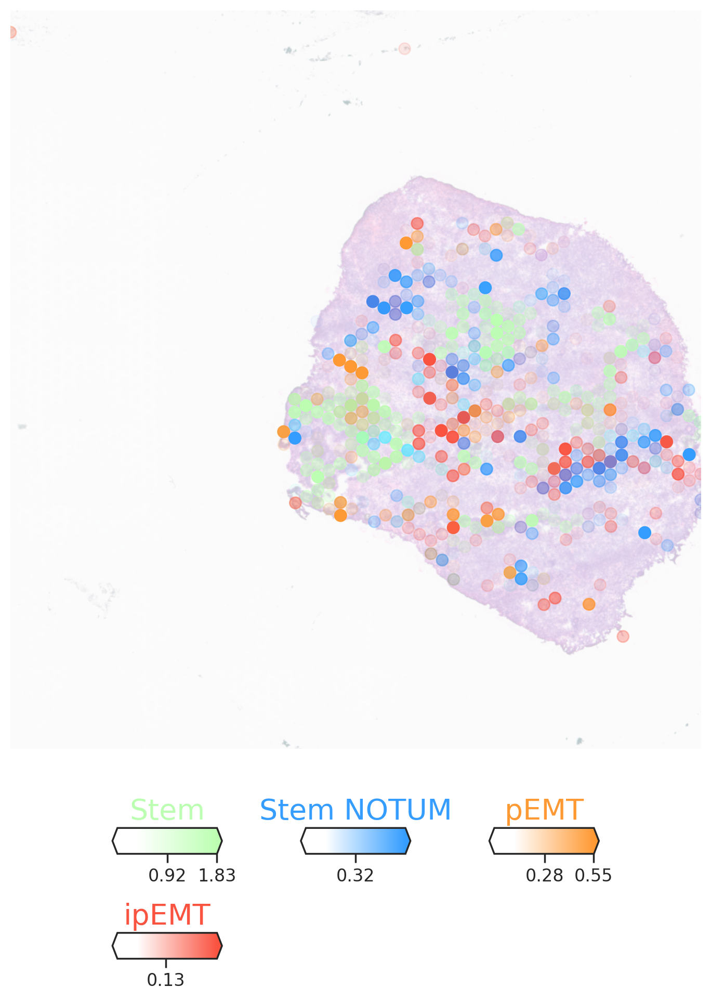

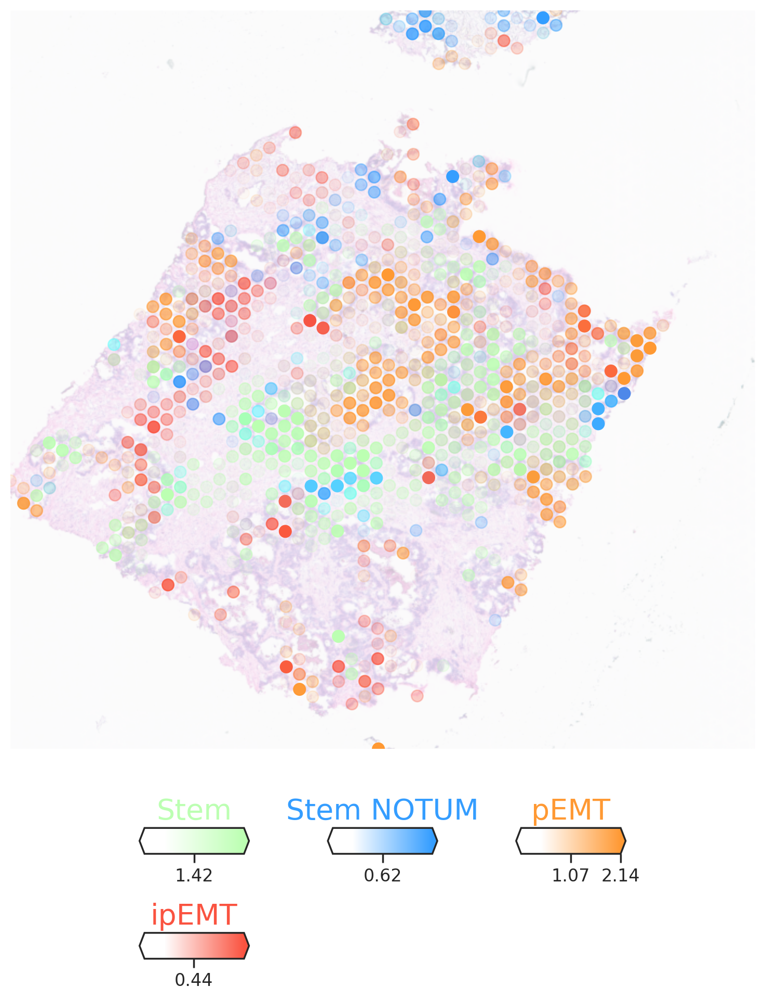

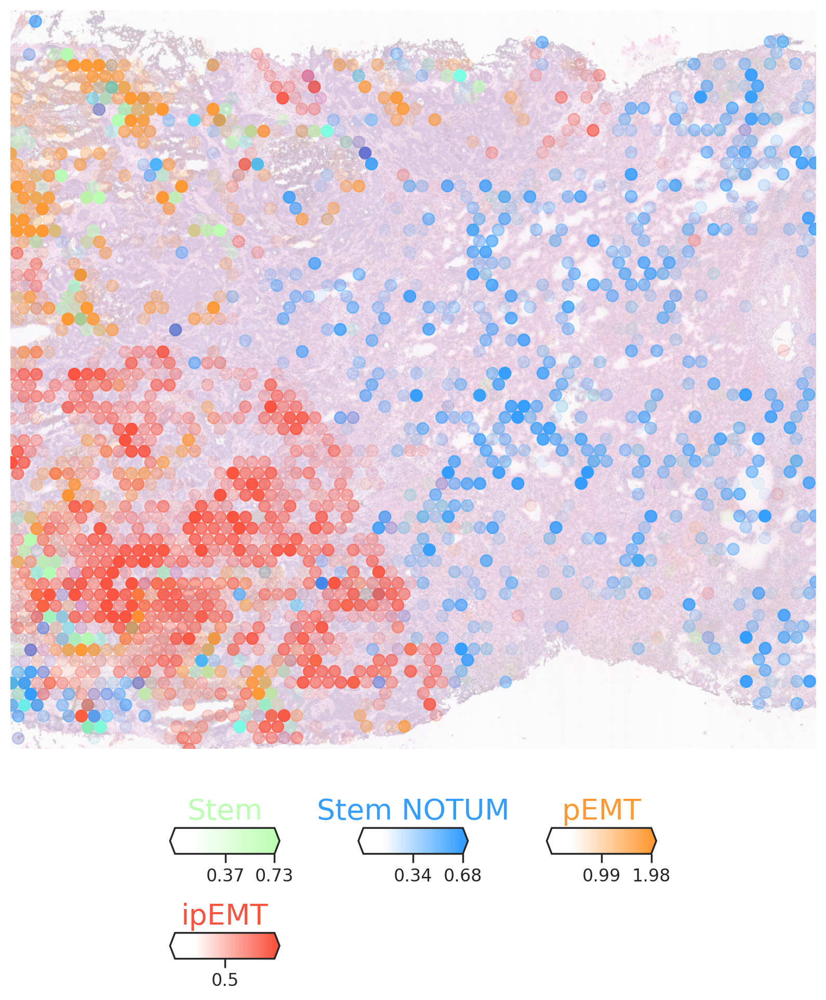

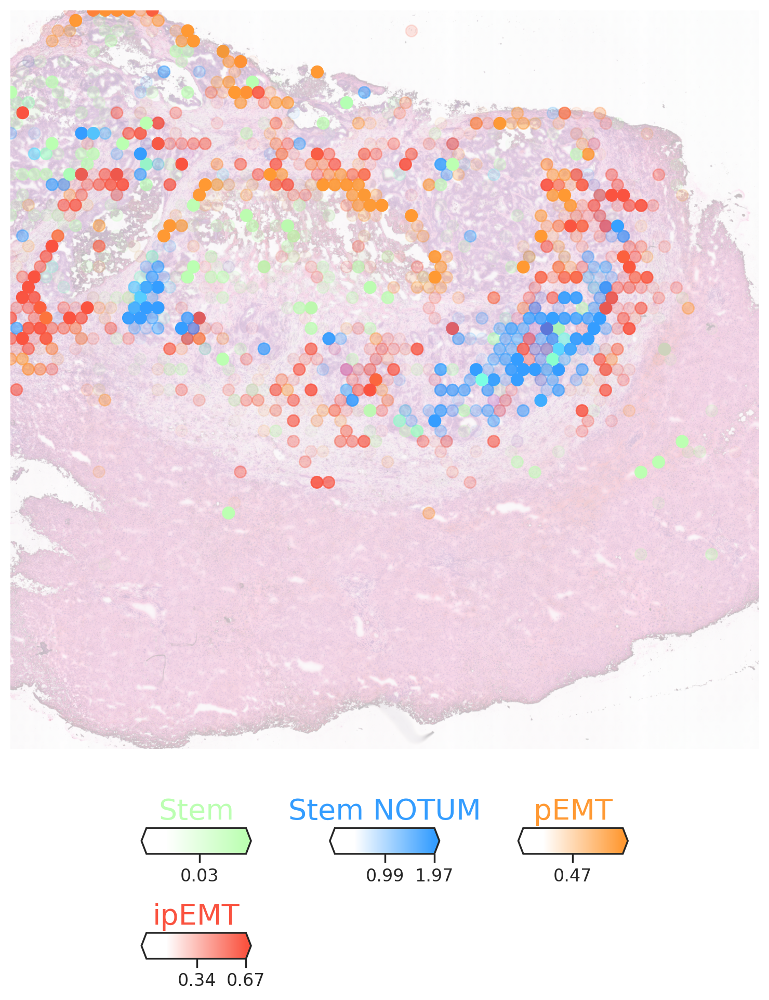

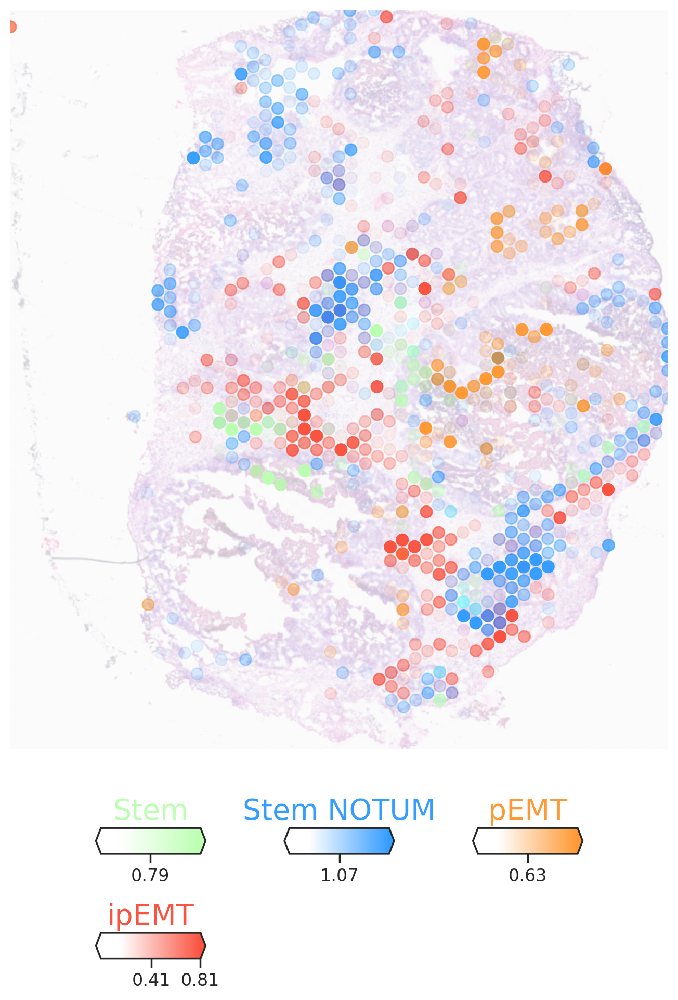

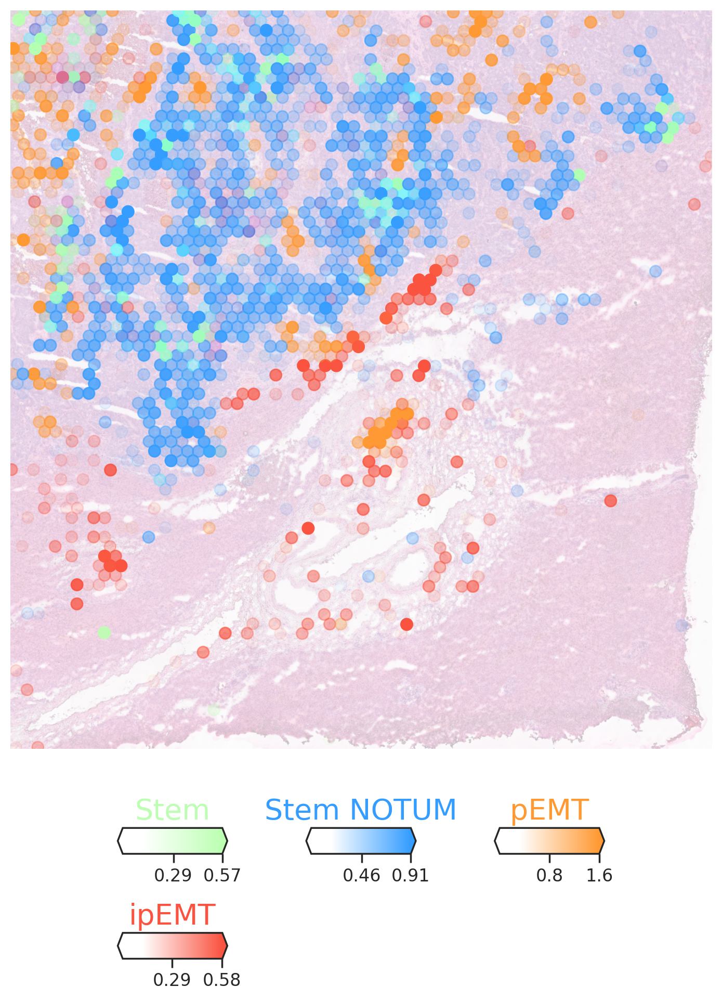

In [13]:
for visium_slide in set(adata_vis.obs.Sample):
    # select one slide
    slide = utils.select_slide(adata_vis, s=visium_slide, batch_key="Sample")
    crop_x, crop_y = spatial_plots.get_crop_coord(slide)

    with mpl.rc_context({"figure.figsize": (12, 12)}):

        fig = cell2loc_spatial_colours.plot_spatial(
                adata=slide,
                # labels to show on a plot
                color=clust_col, # labels of actual names 
                labels=clust_labels, # labels to display in legend
                coords = slide.obsm['spatial'] \
                              * list(slide.uns['spatial'].values())[0]['scalefactors']['tissue_hires_scalef'],
                show_img=True,
                img_alpha=alpha_name_dict[visium_slide][2],
                crop_x=crop_x,
                crop_y=crop_y,
                style="fast",
                # limit color scale at 99.5% quantile of cell abundance
                max_color_quantile=alpha_name_dict[visium_slide][0], #0.995,
                # size of locations (adjust depending on figure size)
                circle_diameter=8, #10, 7
                img=list(slide.uns['spatial'].values())[0]['images']['hires'],
                colorbar_position="bottom",
                colordict_celltype_rgb=mycolor_dict,
                reorder_cmap=range(len(mycolor_dict.keys())) # to say how many cell types to plot
            )


        plt.savefig(
            FIG2SAVE.joinpath(f"{visium_slide}_{name2save}_in_one.pdf"),
            dpi=DPI,
            format="pdf",
            facecolor="w",
            transparent=True,
            edgecolor="w",
            bbox_inches="tight"
        )  